In [99]:
import matplotlib
import matplotlib.pyplot as plt 
import numpy as np
import pandas as pd
import os
import umap
import datashader as ds
import colorcet as cc

from dredFISH.Analysis import TissueGraph
from dredFISH.Visualization import Viz
from dredFISH.Utils.__init__plots import * 
from dredFISH.Utils import powerplots
import importlib
importlib.reload(Viz)
importlib.reload(TissueGraph)

<module 'dredFISH.Analysis.TissueGraph' from '/bigstore/GeneralStorage/fangming/projects/dredfish/packages/dredFISH/dredFISH/Analysis/TissueGraph.py'>

#### Load data

In [67]:
respath = '/bigstore/GeneralStorage/fangming/projects/dredfish/figures/'

In [2]:
basepth = '/bigstore/GeneralStorage/Data/dredFISH/Dataset1'
!ls -alhtr $basepth
!head $basepth"/TMG.json"

total 81M
-rw-r--r-- 1 zach     wollmanlab  16M Jun  9 14:55 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_matrix.csv
-rw-r--r-- 1 zach     wollmanlab  20M Jun  9 14:55 DPNMF_PolyA_2021Nov19_Section_-1850X_270Y_metadata.csv
drwxrwxr-x 2 rwollman wollmanlab 4.0K Jul  7 12:18 .
-rw-rw-r-- 1 rwollman wollmanlab  165 Jul  7 16:00 TMG.json
-rw-r--r-- 1 fangming wollmanlab  40M Jul  7 16:00 cell.h5ad
-rw-r--r-- 1 fangming wollmanlab 6.8M Jul  7 16:00 isozone.h5ad
-rw-rw-r-- 1 rwollman wollmanlab 647K Jul  7 16:00 region.h5ad
-rw-r--r-- 1 fangming wollmanlab    3 Jul  7 16:00 Taxonomy_clusters.csv
-rw-r--r-- 1 fangming wollmanlab    3 Jul  7 16:00 Taxonomy_topics.csv
drwxrwxrwx 7 zach     wollmanlab 4.0K Jul  8 12:44 ..
{"layers_graph": [[0, 1], [0, 2]], "layer_taxonomy_mapping": {"0": 0, "1": 0, "2": 1}, "Taxonomies": ["clusters", "topics"], "Layers": ["cell", "isozone", "region"]}

In [3]:
TMG = TissueGraph.TissueMultiGraph(basepath=basepth, 
                                   redo=False, # load existing 
                                  )
TMG

/bigstore/GeneralStorage/Data/dredFISH/Dataset1/cell.h5ad
/bigstore/GeneralStorage/Data/dredFISH/Dataset1/isozone.h5ad
/bigstore/GeneralStorage/Data/dredFISH/Dataset1/region.h5ad


In [10]:
# spatial coordinates
XY = TMG.Layers[0].XY
x, y = XY[:,0], XY[:,1]
###
x, y = y, x # a temporary hack
###

# measured basis
ftrs_mat = TMG.Layers[0].feature_mat

# types

# regions

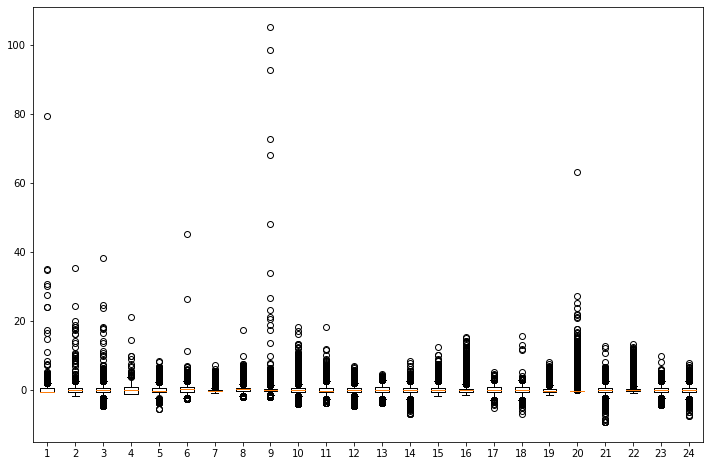

In [8]:
fig, ax = plt.subplots(figsize=(12,8))
ax.boxplot(ftrs_mat)
# ax.set_ylim([-3,10])
plt.show()

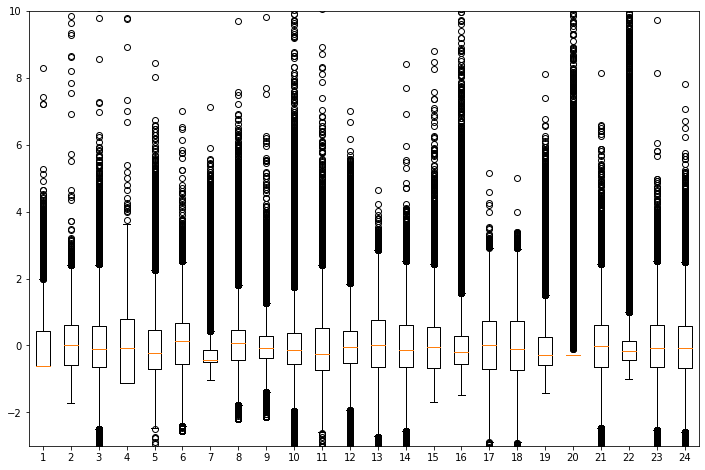

In [9]:
fig, ax = plt.subplots(figsize=(12,8))
ax.boxplot(ftrs_mat)
ax.set_ylim([-3,10])
plt.show()

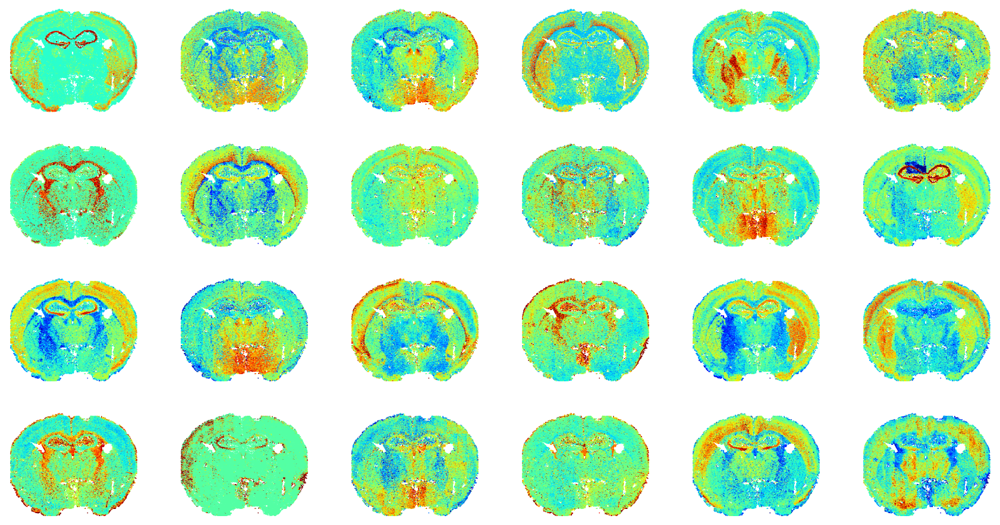

CPU times: user 26 s, sys: 184 ms, total: 26.2 s
Wall time: 26.2 s


In [11]:
%%time
fig, axs = plt.subplots(4, 6, figsize=(6*5, 4*4))
for i in range(24):
    ax = axs.flat[i]
    ax.scatter(x, y, c=ftrs_mat[:,i], s=0.5, cmap='jet', vmin=-3, vmax=3)
    ax.set_aspect('equal')
    ax.axis('off')
plt.show()
    

# 24 bits

In [110]:
df = pd.DataFrame()
df['x'] = x
df['y'] = y
for i in range(24):
    df[f'b{i}'] = ftrs_mat[:,i]
df

,x,y,b0,b1,b2,b3,b4,b5,b6,b7,...,b14,b15,b16,b17,b18,b19,b20,b21,b22,b23
0,1911.666962,-1749.638192,-0.603849,1.714861,0.594060,0.139496,1.509942,-0.114950,-0.383432,-0.130503,...,-1.042621,-0.377495,-1.338384,-1.124956,-0.155036,-0.286638,-0.387834,-0.117224,-0.410755,1.181027
1,1850.678429,-1747.172043,-0.530279,1.681959,1.301185,-0.464006,1.570054,-0.461933,-0.492565,-0.030743,...,-1.203702,-0.556397,-1.356768,-0.828398,-0.328228,-0.286638,-0.932215,-0.271226,-0.222204,1.127544
2,1515.123295,-1746.940031,-0.603849,-0.362498,0.620053,-1.128423,1.206578,-2.549739,-0.601243,-0.362521,...,-0.648550,-0.232972,-1.052768,0.648169,-0.999444,-0.286638,-0.556354,-0.144253,0.490684,2.188804
3,1426.161788,-1748.456394,-0.298989,1.023065,1.517082,-0.341796,0.475449,0.173852,-0.408143,-0.355103,...,-0.788941,-0.282583,-0.611566,-0.450966,0.128447,-0.286638,-0.721338,0.160502,-0.223867,0.029698
4,1739.792930,-1749.407386,-0.603849,-1.351786,1.025515,-1.128423,0.327118,-1.435450,-0.138725,-0.340307,...,-0.761760,-0.927360,-1.564878,-0.801772,1.826586,-0.286638,-1.689133,0.265159,-1.215811,1.532146
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77841,-2188.756848,-1084.480934,-0.603849,-0.271399,-0.666686,0.269214,0.821624,-0.652041,-0.195764,0.272682,...,0.200085,0.508830,-0.120465,0.859582,-0.367392,-0.286638,1.523995,-0.829305,0.446156,-0.338945
77842,-2257.822983,-1083.270665,0.936062,0.386319,-0.614982,1.752306,0.067531,0.282673,-0.074560,-0.010770,...,0.525392,-0.027365,-0.013067,0.760336,-0.100553,-0.286638,-0.447374,0.035593,-0.106235,-0.503376
77843,-2475.320577,-1083.995803,-0.603849,-0.228163,-0.612215,0.895132,0.247026,-0.901201,-0.484248,0.922900,...,0.134591,-0.110296,0.118158,1.764126,-0.434788,1.756892,-0.534186,-0.061414,0.108948,-0.438144
77844,-2311.578984,-1086.717336,-0.603849,-1.153599,0.699586,-0.204732,1.546018,0.460290,-0.279114,-0.694249,...,0.183778,1.903259,-0.663014,0.873821,0.287583,-0.286638,-0.295560,-0.354058,0.229195,-1.402028


464 375
saved the figure to: /bigstore/GeneralStorage/fangming/projects/dredfish/figures/basis_space_2022-07-13.pdf


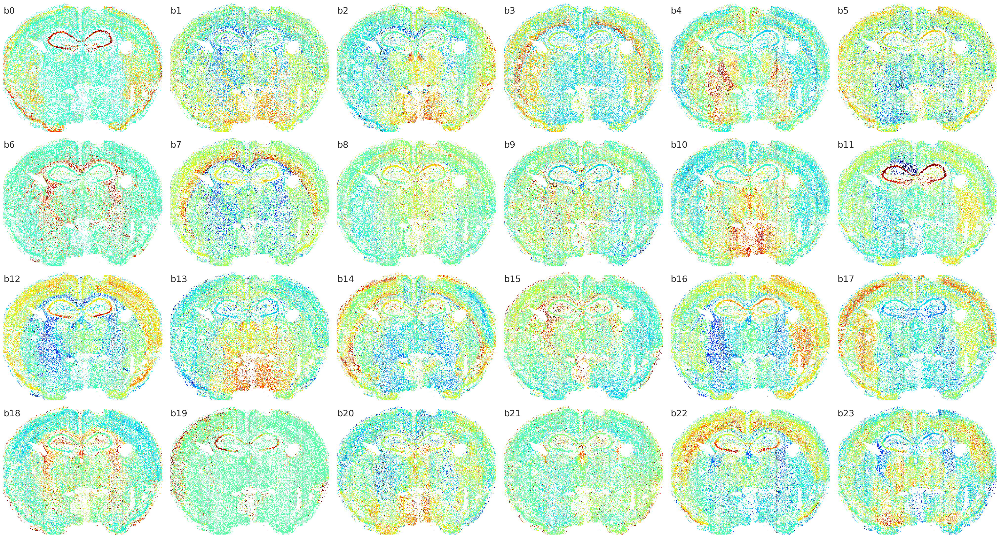

CPU times: user 4.61 s, sys: 24.1 ms, total: 4.63 s
Wall time: 4.64 s


In [124]:
%%time
path = os.path.join(respath, 'basis_space.pdf')
P = powerplots.PlotScale(df['x'].max()-df['x'].min(), 
                         df['y'].max()-df['y'].min(),
                         # npxlx=300,
                         pxl_scale=20,
                        )
print(P.npxlx, P.npxly)

nx, ny = 6, 4
fig, axs = plt.subplots(ny, nx, figsize=(nx*6, ny*5))
for i in range(24):
    ax = axs.flat[i]
    aggdata = ds.Canvas(P.npxlx, P.npxly).points(df, 'x', 'y', agg=ds.mean(f'b{i}'))
    ax.imshow(aggdata, origin='lower', aspect='equal', cmap='jet', vmin=-3, vmax=3, interpolation='none')
    ax.set_title(f'b{i}', loc='left', y=0.9)
    ax.axis('off')
fig.subplots_adjust(wspace=0.05, hspace=0)
powerplots.savefig_autodate(fig, path)
plt.show()

# UMAP across 24 bits

In [125]:
%%time
umap_mat = umap.UMAP(n_neighbors=30, min_dist=0.1).fit_transform(ftrs_mat)
umap_mat.shape


CPU times: user 1h 22min 24s, sys: 50.1 s, total: 1h 23min 14s
Wall time: 1min 47s


(77846, 2)

In [126]:
df['umap_x'] = umap_mat[:,0]
df['umap_y'] = umap_mat[:,1]

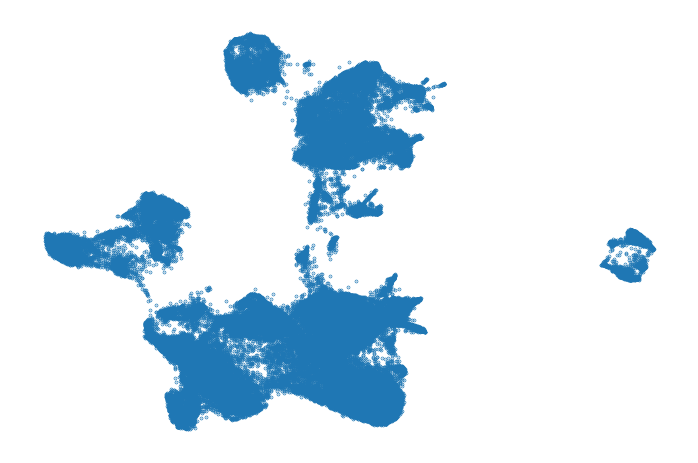

In [127]:
fig, ax = plt.subplots()
ax.scatter(umap_mat[:,0], umap_mat[:,1], s=0.1)
ax.axis('off')
plt.show()

300 258
saved the figure to: /bigstore/GeneralStorage/fangming/projects/dredfish/figures/basis_umap_2022-07-13.pdf


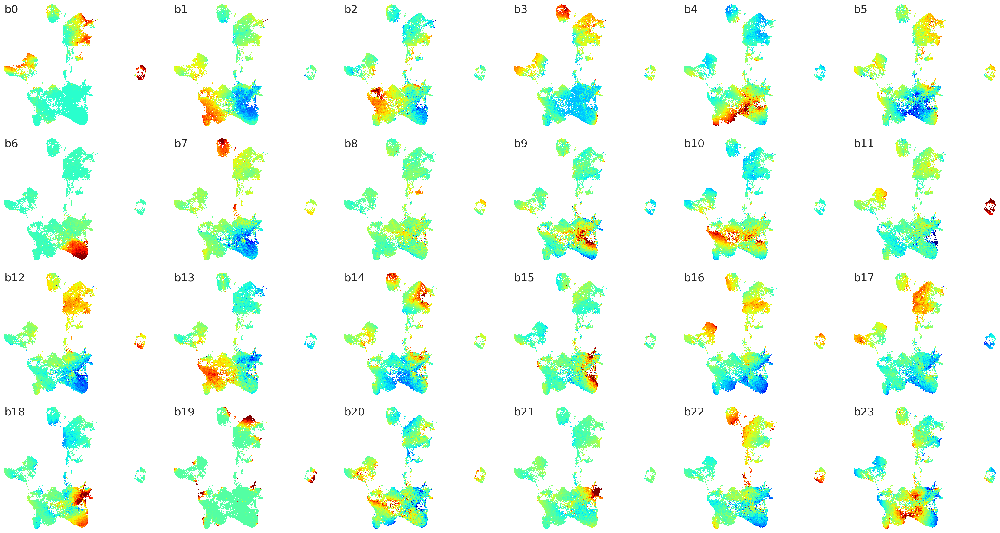

CPU times: user 2.23 s, sys: 20 ms, total: 2.25 s
Wall time: 2.24 s


In [131]:
%%time
x, y = 'umap_x', 'umap_y'
path = os.path.join(respath, 'basis_umap.pdf')
P = powerplots.PlotScale(df[x].max()-df[x].min(), 
                         df[y].max()-df[y].min(),
                         npxlx=300,
                        )
print(P.npxlx, P.npxly)

nx, ny = 6, 4
fig, axs = plt.subplots(ny, nx, figsize=(nx*5, ny*4))
for i in range(24):
    ax = axs.flat[i]
    aggdata = ds.Canvas(P.npxlx, P.npxly).points(df, x, y, agg=ds.mean(f'b{i}'))
    ax.imshow(aggdata, origin='lower', aspect='equal', cmap='jet', vmin=-3, vmax=3, interpolation='none')
    ax.set_title(f'b{i}', loc='left', y=0.9)
    ax.axis('off')
fig.subplots_adjust(wspace=0.05, hspace=0.1)
powerplots.savefig_autodate(fig, path)
plt.show()

# Cell types (Leiden clustering)

# Local env (Isozones)
- same cell type zones
- instead quantify the nearest neighbors of the same cell type

# Local env (brain regions)